#  Exploratory Data Analysis of Seoul Air Pollution

This analysis aims to explore air pollution data in Seoul, providing insights into environmental conditions and potential health risks. The following dataset, collected by the Seoul Metropolitan Government and sourced from Kaggle, presents comprehensive air pollution figures. [1] It encompasses hourly recordings from 25 monitoring stations across Seoul, South Korea, spanning from the beginning of 2017 to the end of 2019. The key pollutants measured include Sulfur Dioxide (SO2), Nitrogen Dioxide (NO2), Ozone (O3), Carbon Monoxide (CO), and two variants of Particulate Matter, namely PM10 and PM2.5. While SO2, NO2, O3, and CO concentrations are measured in parts per million (ppm) or milligrams per liter (mg/L), Particulate Matter concentrations are denoted in micrograms per cubic meter (µg/m3). PM10 and PM2.5 distinctions represent size categories of particulate matter, with PM10 referring to particles with a diameter of 10 micrometers or smaller and PM2.5 denoting finer particles with a diameter of 2.5 micrometers or smaller. [2]

Air pollution is a complex issue stemming from various anthropogenic activities. Understanding the origins of these pollutants is crucial for addressing the environmental and health challenges associated with deteriorating air quality. Particulates, consisting of fine solids and liquids suspended in the air, arise from various sources, including industrial processes like combustion in coal-burning power plants and emissions from motor vehicles. Sulfur dioxide and nitrogen dioxide are significant pollutants originating from fossil fuel combustion in industrial and transportation sectors. Carbon monoxide results from incomplete combustion in mobile sectors like transportation and residential heating. Ozone, a photochemical oxidant, forms when volatile organic compounds (VOCs), emitted from sources such as industrial processes and vehicle exhaust, react with nitrogen dioxide in the presence of sunlight.[3]

Chronic exposure to air pollutants can have profound implications for both the environment and human health. Particulate matter has adverse effects on the environment, reducing visibility through smog and causing corrosion of building materials. Health problems stemming from exposure are a major concern, particularly with smaller particles that can penetrate deep into the lungs, leading to respiratory illnesses like bronchitis and asthma, cardiovascular disease, in addition to the risk of certain particles being carcinogenic. Sulfur dioxide exposure shares similar health risks to particulates. Nitrogen dioxide can contribute to acidic deposition and acid rain, causing nose and eye irritation along with ozone exposure. Carbon monoxide poses toxicity to humans through its interaction with blood hemoglobin, reducing the supply of oxygen to the rest of the body. [3]

When looking into this dataset, the primary focus is on computing the Air Quality Index (AQI) for Seoul, offering a comprehensive assessment of air health, and identifying vulnerable populations subject to prolonged exposure risks. Moreover, visualizations illustrating the AQI and individual pollutant levels across a monthly timeframe will be presented. Comparative analyses will be conducted between months providing insights into temporal trends. The exploration will leverage Python libraries, including NumPy, Pandas, Seaborn, and Matplotlib, to facilitate exploration, analysis and visualization.


## Acquiring the Dataset

In [1]:
#Importing numpy and pandas
import numpy as np
import pandas as pd

In [2]:
#Installing the opendatasets library quietly
!pip install opendatasets --upgrade --quiet

In [3]:
#Kaggle dataset URL containing air pollution information for Seoul
dataset_url = 'https://www.kaggle.com/datasets/bappekim/air-pollution-in-seoul' 

In [4]:
#Downloading dataset using the opendatasets library
import opendatasets as od
od.download(dataset_url)

Skipping, found downloaded files in ".\air-pollution-in-seoul" (use force=True to force download)


In [5]:
#Specifying directory path where files are stored and listed
import os
data_dir = './air-pollution-in-seoul'
os.listdir(data_dir)

['AirPollutionSeoul']

## Data Preparation and Cleaning

In [6]:
#Loading raw data
air_pollution_raw_df = pd.read_csv('Measurement_summary.csv')
air_pollution_raw_df

,Measurement date,Station code,Address,Latitude,Longitude,SO2,NO2,O3,CO,PM10,PM2.5
0,2017-01-01 00:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.059,0.002,1.2,73.0,57.0
1,2017-01-01 01:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.058,0.002,1.2,71.0,59.0
2,2017-01-01 02:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.056,0.002,1.2,70.0,59.0
3,2017-01-01 03:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.056,0.002,1.2,70.0,58.0
4,2017-01-01 04:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.003,0.051,0.002,1.2,69.0,61.0
...,...,...,...,...,...,...,...,...,...,...,...
647506,2019-12-31 19:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",37.544962,127.136792,0.003,0.028,0.013,0.5,23.0,17.0
647507,2019-12-31 20:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",37.544962,127.136792,0.003,0.025,0.015,0.4,25.0,19.0
647508,2019-12-31 21:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",37.544962,127.136792,0.003,0.023,0.015,0.4,24.0,17.0
647509,2019-12-31 22:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",37.544962,127.136792,0.003,0.040,0.004,0.5,25.0,18.0


In [7]:
#Making a copy for processing
air_pollution_df = air_pollution_raw_df.copy()

In [8]:
#Adding underscore to column names
air_pollution_df.rename(columns = {'Measurement date':'Measurement_date', 'Station code':'Station_code'}, inplace = True)

#Keeping only address column for location 
air_pollution_df.drop(columns=['Latitude', 'Longitude'], inplace=True)
air_pollution_df

,Measurement_date,Station_code,Address,SO2,NO2,O3,CO,PM10,PM2.5
0,2017-01-01 00:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.004,0.059,0.002,1.2,73.0,57.0
1,2017-01-01 01:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.004,0.058,0.002,1.2,71.0,59.0
2,2017-01-01 02:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.004,0.056,0.002,1.2,70.0,59.0
3,2017-01-01 03:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.004,0.056,0.002,1.2,70.0,58.0
4,2017-01-01 04:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.003,0.051,0.002,1.2,69.0,61.0
...,...,...,...,...,...,...,...,...,...
647506,2019-12-31 19:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",0.003,0.028,0.013,0.5,23.0,17.0
647507,2019-12-31 20:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",0.003,0.025,0.015,0.4,25.0,19.0
647508,2019-12-31 21:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",0.003,0.023,0.015,0.4,24.0,17.0
647509,2019-12-31 22:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",0.003,0.040,0.004,0.5,25.0,18.0


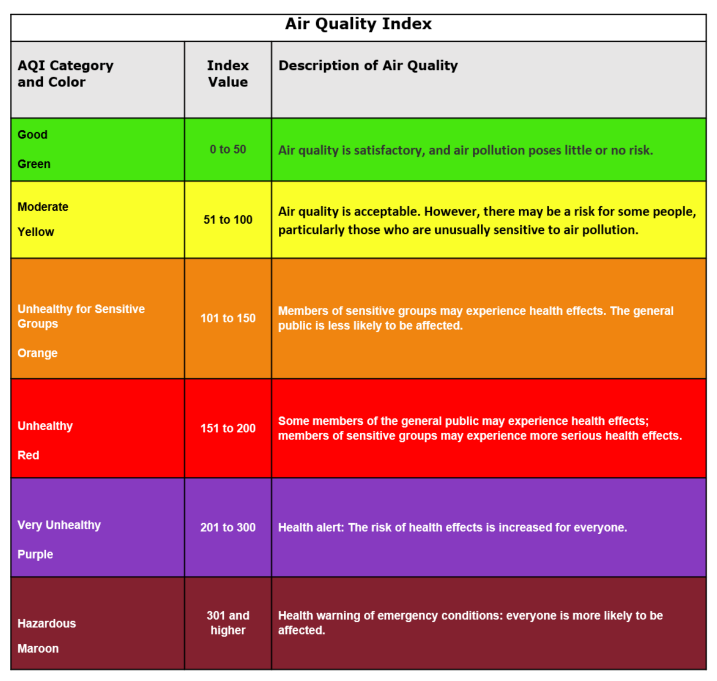

In [9]:
#Importing necessary libraries for image retrieval and visualization
import requests
from io import BytesIO
from PIL import Image
import matplotlib
import matplotlib.pyplot as plt
from urllib.request import urlretrieve

url = 'https://www.epa.gov/sites/default/files/2019-07/aqitableforcourse.png'
headers = {'User-Agent': 
           'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

#Sending an HTTP GET request to the specified URL with headers
response = requests.get(url, headers=headers)

#Opening image from binary content received
img = Image.open(BytesIO(response.content))
img_array = np.array(img)

plt.figure(figsize=(9, 9))
plt.grid(False)
plt.axis('off')
plt.imshow(img_array)
plt.show()

AQI chart illustrating values and categories along with associated health risks resulting from prolonged exposure [Source: EPA] 

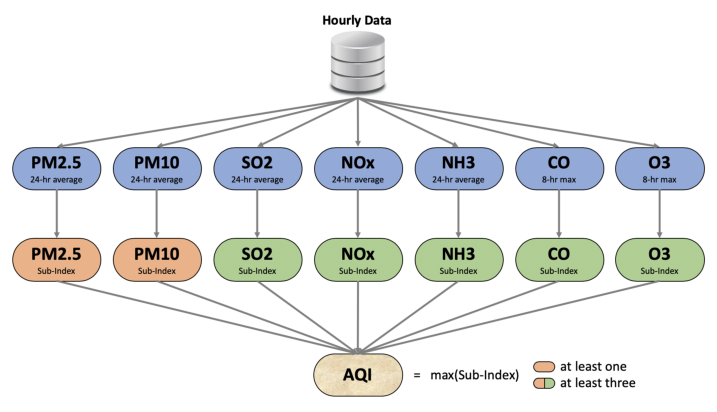

In [10]:
img = Image.open('chart.jpg')
img_array = np.array(img)

plt.figure(figsize=(9, 9))
plt.grid(False)
plt.axis('off')
plt.imshow(img_array)
plt.show()

Diagram demonstrating the conversion process of hourly pollutant concentration data into corresponding AQI values. The calculation incorporates the 8-hour Ozone concentration values, the usage of 1-hour values is optional [2]

In [11]:
#Sulfur dioxide
#Calculating the 24-hour rolling average concentrations for each station
air_pollution_df["SO2_average"] = air_pollution_df.groupby("Station_code")["SO2"].rolling(window = 24).mean().values

#Defining a function to calculate the subindex based on concentration levels
def SO2_subindex(x):
    if x <= 40:
        return x * (50/40)
    elif x <= 80:
        return 50 + (x-40) * (50/40)
    elif x <= 380:
        return 100 + (x-80) * (100/300)
    elif x <= 800:
        return 200 + (x-380) * (100/420)
    elif x <= 1600:
        return 300 + (x-800) * (100/800)
    elif x > 1600:
        return 400 + (x-1600) * (100/800)
    else:
        return 0

#Applying subindex function to create a new column
air_pollution_df["SO2_SubIndex"] = air_pollution_df["SO2_average"].apply(lambda x: SO2_subindex(x))

AQI calculation involves deriving subindices for each pollutant, achieved through the use of the groupby function and conditional statements. This process effectively emulates a segmented linear function to determine the overall Air Quality Index [4]

In [12]:
#Nitrogen dioxide
air_pollution_df["NO2_average"] = air_pollution_df.groupby("Station_code")["NO2"].rolling(window = 24).mean().values

def NO2_subindex(x):
    if x <= 40:
        return x * (50/40)
    elif x <= 80:
        return 50 + (x-40) * (50/40)
    elif x <= 180:
        return 100 + (x-80) * (100/100)
    elif x <= 280:
        return 200 + (x-180) * (100/100)
    elif x <= 400:
        return 300 + (x-280) * (100/120)
    elif x > 400:
        return 400 + (x-400) * (100/120)
    else:
        return 0

air_pollution_df["NO2_SubIndex"] = air_pollution_df["NO2_average"].apply(lambda x: NO2_subindex(x))

In [13]:
#Ozone
#Calculating the 8-hour rolling average concentrations for each station
air_pollution_df["O3_average"] = air_pollution_df.groupby("Station_code")["O3"].rolling(window = 8).max().values

def O3_subindex(x):
    if x <= 50:
        return x * (50/50)
    elif x <= 100:
        return 50 + (x-50) * (50/50)
    elif x <= 168:
        return 100 + (x-100) * (100/68)
    elif x <= 208:
        return 200 + (x-168) * (100/40)
    elif x <= 748:
        return 300 + (x-208) * (100/539)
    elif x > 748:
        return 400 + (x-400) * (100/539)
    else:
        return 0

air_pollution_df["O3_SubIndex"] = air_pollution_df["O3_average"].apply(lambda x: O3_subindex(x))

In [14]:
#Carbon monoxide
air_pollution_df["CO_average"] = air_pollution_df.groupby("Station_code")["CO"].rolling(window = 8).max().values

def CO_subindex(x):
    if x <= 1:
        return x * (50/1)
    elif x <= 2:
        return 50 + (x-1) * (50/1)
    elif x <= 10:
        return 100 + (x-2) * (100/8)
    elif x <= 17:
        return 200 + (x-10) * (100/7)
    elif x <= 34:
        return 300 + (x-17) * (100/17)
    elif x > 34:
        return 400 + (x-34) * (100/17)
    else:
        return 0

air_pollution_df["CO_SubIndex"] = air_pollution_df["CO_average"].apply(lambda x: CO_subindex(x))

In [15]:
#Particulate matter (10)
air_pollution_df["PM10_average"] = air_pollution_df.groupby("Station_code")["PM10"].rolling(window = 24).mean().values

def PM10_subindex(x):
    if x <= 50:
        return x
    elif x <= 100:
        return x
    elif x <= 250:
        return 100 + (x-100) * (100/150)
    elif x <= 350:
        return 200 + (x-250)
    elif x <= 430:
        return 300 + (x-350) * (100/80)
    elif x > 430:
        return 400 + (x-430) * (100/80)
    else:
        return 0

air_pollution_df["PM10_SubIndex"] = air_pollution_df["PM10_average"].apply(lambda x: PM10_subindex(x))

In [16]:
#Particulate matter (2.5)
air_pollution_df["PM2.5_average"] = air_pollution_df.groupby("Station_code")["PM2.5"].rolling(window = 24).mean().values

def PM2_subindex(x):
    if x <= 30:
        return x * (50/30)
    elif x <= 60:
        return 50 + (x-30) * (50/30)
    elif x <= 90:
        return 100 + (x-60) * (100/30)
    elif x <= 120:
        return 200 + (x-90) * (100/30)
    elif x <= 250:
        return 300 + (x-120) * (100/130)
    elif x > 250:
        return 400 + (x-250) * (100/130)
    else:
        return 0

air_pollution_df["PM2.5_SubIndex"] = air_pollution_df["PM2.5_average"].apply(lambda x: PM2_subindex(x))

In [17]:
#Categorizing AQI levels based on U.S. EPA standards
def AQI_level(x):
    if x <= 50:
        return "Good"
    elif x <= 100:
        return "Moderate"
    elif x <= 150:
        return "Unhealthy For Sensitive Groups"
    elif x <= 200:
        return "Unhealthy"
    elif x <= 300:
        return "Very Unhealthy"
    elif x <= 500:
        return "Hazardous"
    else:
        return np.NaN
    
#Calculating AQI by rounding the maximum subindex values among pollutants
air_pollution_df["AQI_calculated"] = round(air_pollution_df[["SO2_SubIndex", "NO2_SubIndex", "O3_SubIndex", "CO_SubIndex", 
                                 "PM2.5_SubIndex", "PM10_SubIndex"]].max(axis = 1))
air_pollution_df.loc[air_pollution_df["PM10_SubIndex"] + air_pollution_df["PM2.5_SubIndex"] <= 0, "AQI_calculated"] = np.NaN

#Assigning AQI levels based on the calculated AQI
air_pollution_df["AQI_level"] = air_pollution_df["AQI_calculated"].apply(lambda x: AQI_level(x))
air_pollution_df[~air_pollution_df.AQI_calculated.isna()]

#Removing superfluous columns to make the data table more concise
air_pollution_df.drop(columns=["SO2_SubIndex", "NO2_SubIndex", "O3_SubIndex", "CO_SubIndex", 
                                   "PM2.5_SubIndex", "PM10_SubIndex", "SO2_average","NO2_average", "O3_average", 
                                   "CO_average", "PM10_average", "PM2.5_average"], inplace=True)
air_pollution_df

,Measurement_date,Station_code,Address,SO2,NO2,O3,CO,PM10,PM2.5,AQI_calculated,AQI_level
0,2017-01-01 00:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.004,0.059,0.002,1.2,73.0,57.0,NaN,NaN
1,2017-01-01 01:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.004,0.058,0.002,1.2,71.0,59.0,NaN,NaN
2,2017-01-01 02:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.004,0.056,0.002,1.2,70.0,59.0,NaN,NaN
3,2017-01-01 03:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.004,0.056,0.002,1.2,70.0,58.0,NaN,NaN
4,2017-01-01 04:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.003,0.051,0.002,1.2,69.0,61.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
647506,2019-12-31 19:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",0.003,0.028,0.013,0.5,23.0,17.0,33.0,Good
647507,2019-12-31 20:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",0.003,0.025,0.015,0.4,25.0,19.0,33.0,Good
647508,2019-12-31 21:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",0.003,0.023,0.015,0.4,24.0,17.0,32.0,Good
647509,2019-12-31 22:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",0.003,0.040,0.004,0.5,25.0,18.0,32.0,Good


In [18]:
#Before date conversion
print(air_pollution_df['Measurement_date'].head())

0    2017-01-01 00:00
1    2017-01-01 01:00
2    2017-01-01 02:00
3    2017-01-01 03:00
4    2017-01-01 04:00
Name: Measurement_date, dtype: object


In [19]:
#Converting date column into correct time frame
air_pollution_df['Measurement_date'] = pd.to_datetime(air_pollution_df['Measurement_date'], format='%Y-%m-%d')

In [20]:
#After date conversion
print(air_pollution_df['Measurement_date'].head())

0   2017-01-01 00:00:00
1   2017-01-01 01:00:00
2   2017-01-01 02:00:00
3   2017-01-01 03:00:00
4   2017-01-01 04:00:00
Name: Measurement_date, dtype: datetime64[ns]


In [21]:
#Selecting data for the month of November 2017 for in-depth analysis
nov2017_df = air_pollution_df.query("'2017-11-01'< Measurement_date < '2017-12-01'")
nov2017_df

,Measurement_date,Station_code,Address,SO2,NO2,O3,CO,PM10,PM2.5,AQI_calculated,AQI_level
7297,2017-11-01 01:00:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.005,0.031,0.023,0.2,28.0,15.0,34.0,Good
7298,2017-11-01 02:00:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.006,0.044,0.011,0.3,32.0,19.0,34.0,Good
7299,2017-11-01 03:00:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.005,0.042,0.009,0.3,38.0,22.0,35.0,Good
7300,2017-11-01 04:00:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.005,0.046,0.006,0.3,41.0,25.0,35.0,Good
7301,2017-11-01 05:00:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",0.005,0.046,0.006,0.3,42.0,24.0,35.0,Good
...,...,...,...,...,...,...,...,...,...,...,...
629618,2017-11-30 19:00:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",0.004,0.024,0.023,0.4,18.0,8.0,38.0,Good
629619,2017-11-30 20:00:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",0.003,0.025,0.023,0.4,14.0,5.0,36.0,Good
629620,2017-11-30 21:00:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",0.003,0.023,0.024,0.4,16.0,10.0,34.0,Good
629621,2017-11-30 22:00:00,125,"59, Gucheonmyeon-ro 42-gil, Gangdong-gu, Seoul...",0.005,0.018,0.027,0.4,19.0,16.0,32.0,Good


In [22]:
#Observing data metrics
nov2017_df.describe()

,Station_code,SO2,NO2,O3,CO,PM10,PM2.5,AQI_calculated
count,17975.000000,17975.000000,17975.000000,17975.000000,17975.000000,17975.000000,17975.000000,17975.000000
mean,113.000000,0.004702,0.032626,0.013973,0.576172,41.620306,22.059193,47.931015
std,7.211303,0.002203,0.016124,0.011353,0.246825,21.774538,12.537260,15.139525
min,101.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,16.000000
25%,107.000000,0.004000,0.019000,0.003000,0.400000,27.000000,13.000000,37.000000
50%,113.000000,0.005000,0.031000,0.011000,0.500000,37.000000,20.000000,45.000000
75%,119.000000,0.005000,0.044000,0.022000,0.700000,50.000000,28.000000,57.000000
max,125.000000,0.233000,0.098000,0.069000,2.500000,274.000000,137.000000,116.000000


In [23]:
#Checking unique station codes in the November 2017 data
nov2017_df.Station_code.unique()

array([101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113,
       114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125],
      dtype=int64)

In [24]:
#Restructuring table
#AQI table
nov2017_AQI_df = nov2017_df.pivot(index = "Measurement_date", columns = "Station_code", values = "AQI_calculated")
nov2017_AQI_df

Station_code,101,102,103,104,105,106,107,108,109,110,...,116,117,118,119,120,121,122,123,124,125
Measurement_date,,,,,,,,,,,,,,,,,,,,,
2017-11-01 01:00:00,34.0,30.0,27.0,35.0,31.0,35.0,31.0,35.0,36.0,33.0,...,45.0,35.0,30.0,65.0,34.0,37.0,34.0,34.0,34.0,40.0
2017-11-01 02:00:00,34.0,30.0,28.0,35.0,31.0,35.0,31.0,35.0,36.0,33.0,...,45.0,34.0,30.0,65.0,34.0,37.0,34.0,35.0,34.0,39.0
2017-11-01 03:00:00,35.0,30.0,27.0,35.0,31.0,35.0,31.0,35.0,36.0,33.0,...,45.0,34.0,30.0,65.0,34.0,37.0,35.0,36.0,34.0,39.0
2017-11-01 04:00:00,35.0,30.0,28.0,35.0,31.0,30.0,31.0,35.0,36.0,33.0,...,40.0,34.0,30.0,50.0,35.0,37.0,35.0,36.0,34.0,39.0
2017-11-01 05:00:00,35.0,30.0,28.0,35.0,31.0,27.0,32.0,35.0,36.0,32.0,...,35.0,34.0,30.0,41.0,35.0,37.0,35.0,37.0,33.0,39.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-30 19:00:00,48.0,25.0,21.0,31.0,27.0,21.0,35.0,29.0,40.0,28.0,...,24.0,26.0,27.0,35.0,31.0,21.0,37.0,25.0,32.0,38.0
2017-11-30 20:00:00,45.0,24.0,20.0,30.0,25.0,20.0,33.0,28.0,39.0,26.0,...,23.0,25.0,26.0,35.0,30.0,20.0,35.0,24.0,30.0,36.0
2017-11-30 21:00:00,43.0,22.0,19.0,29.0,25.0,20.0,32.0,26.0,38.0,25.0,...,22.0,24.0,24.0,35.0,29.0,19.0,34.0,23.0,28.0,34.0


In [25]:
#Sulfur dioxide table
nov2017_SO2_df = nov2017_df.pivot(index = "Measurement_date", columns = "Station_code", values = "SO2")
nov2017_SO2_df

Station_code,101,102,103,104,105,106,107,108,109,110,...,116,117,118,119,120,121,122,123,124,125
Measurement_date,,,,,,,,,,,,,,,,,,,,,
2017-11-01 01:00:00,0.005,0.006,0.004,0.007,0.005,0.005,0.004,0.004,0.005,0.006,...,0.005,0.008,0.004,0.007,0.005,0.008,0.005,0.006,0.004,0.005
2017-11-01 02:00:00,0.006,0.005,0.003,0.007,0.005,0.005,0.004,0.004,0.005,0.006,...,0.004,0.008,0.004,0.007,0.005,0.008,0.005,0.005,0.004,0.005
2017-11-01 03:00:00,0.005,0.005,0.003,0.007,0.005,0.005,0.004,0.004,0.005,0.006,...,0.005,0.008,0.003,0.006,0.005,0.008,0.005,0.005,0.004,0.004
2017-11-01 04:00:00,0.005,0.005,0.004,0.007,0.005,0.004,0.004,0.004,0.005,0.006,...,0.005,0.008,0.003,0.007,0.004,0.007,0.005,0.005,0.004,0.004
2017-11-01 05:00:00,0.005,0.004,0.004,0.007,0.005,0.004,0.004,0.004,0.005,0.006,...,0.004,0.008,0.003,0.007,0.005,0.007,0.005,0.005,0.004,0.005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-30 19:00:00,0.005,0.003,0.003,0.005,0.003,0.004,0.005,0.002,0.005,0.005,...,0.004,0.005,0.003,0.005,0.003,0.005,0.003,0.004,0.004,0.004
2017-11-30 20:00:00,0.004,0.003,0.003,0.005,0.003,0.004,0.004,0.002,0.006,0.006,...,0.005,0.005,0.003,0.006,0.003,0.005,0.003,0.004,0.003,0.003
2017-11-30 21:00:00,0.004,0.003,0.003,0.005,0.003,0.004,0.004,0.001,0.005,0.005,...,0.004,0.005,0.003,0.005,0.003,0.005,0.004,0.005,0.004,0.003


In [26]:
#Nitrogen dioxide table
nov2017_NO2_df = nov2017_df.pivot(index = "Measurement_date", columns = "Station_code", values = "NO2")
nov2017_NO2_df

Station_code,101,102,103,104,105,106,107,108,109,110,...,116,117,118,119,120,121,122,123,124,125
Measurement_date,,,,,,,,,,,,,,,,,,,,,
2017-11-01 01:00:00,0.031,0.026,0.024,0.030,0.023,0.021,0.049,0.053,0.044,0.030,...,0.030,0.018,0.024,0.021,0.025,0.021,0.019,0.031,0.048,0.053
2017-11-01 02:00:00,0.044,0.030,0.033,0.026,0.022,0.021,0.042,0.052,0.038,0.027,...,0.027,0.018,0.026,0.020,0.027,0.020,0.018,0.026,0.045,0.047
2017-11-01 03:00:00,0.042,0.030,0.029,0.025,0.021,0.019,0.049,0.050,0.043,0.022,...,0.026,0.019,0.021,0.020,0.022,0.018,0.018,0.024,0.043,0.037
2017-11-01 04:00:00,0.046,0.026,0.020,0.023,0.021,0.019,0.039,0.044,0.038,0.025,...,0.028,0.017,0.018,0.021,0.017,0.016,0.018,0.023,0.034,0.031
2017-11-01 05:00:00,0.046,0.029,0.026,0.029,0.022,0.022,0.045,0.045,0.038,0.033,...,0.033,0.024,0.028,0.024,0.018,0.020,0.022,0.024,0.032,0.033
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-30 19:00:00,0.027,0.021,0.024,0.025,0.018,0.026,0.022,0.022,0.021,0.025,...,0.029,0.020,0.027,0.024,0.024,0.030,0.018,0.029,0.020,0.024
2017-11-30 20:00:00,0.024,0.023,0.023,0.026,0.018,0.024,0.023,0.021,0.023,0.023,...,0.032,0.019,0.032,0.027,0.024,0.026,0.016,0.023,0.020,0.025
2017-11-30 21:00:00,0.022,0.017,0.017,0.023,0.017,0.022,0.019,0.016,0.020,0.023,...,0.021,0.018,0.029,0.022,0.021,0.028,0.014,0.022,0.016,0.023


In [27]:
#Ozone table
nov2017_O3_df = nov2017_df.pivot(index = "Measurement_date", columns = "Station_code", values = "O3")
nov2017_O3_df

Station_code,101,102,103,104,105,106,107,108,109,110,...,116,117,118,119,120,121,122,123,124,125
Measurement_date,,,,,,,,,,,,,,,,,,,,,
2017-11-01 01:00:00,0.023,0.027,0.022,0.020,0.024,0.029,0.005,0.011,0.005,0.019,...,0.010,0.016,0.030,0.027,0.029,0.026,0.028,0.012,0.002,0.002
2017-11-01 02:00:00,0.011,0.024,0.008,0.023,0.026,0.029,0.009,0.011,0.007,0.020,...,0.011,0.016,0.027,0.025,0.023,0.028,0.028,0.016,0.003,0.004
2017-11-01 03:00:00,0.009,0.023,0.013,0.024,0.026,0.030,0.005,0.012,0.003,0.023,...,0.012,0.015,0.032,0.024,0.029,0.029,0.028,0.016,0.006,0.011
2017-11-01 04:00:00,0.006,0.028,0.020,0.029,0.028,0.030,0.009,0.015,0.005,0.021,...,0.011,0.017,0.036,0.026,0.037,0.030,0.028,0.017,0.014,0.016
2017-11-01 05:00:00,0.006,0.027,0.013,0.023,0.028,0.027,0.004,0.015,0.005,0.015,...,0.009,0.011,0.027,0.023,0.036,0.028,0.024,0.017,0.011,0.014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-30 19:00:00,0.020,0.026,0.019,0.024,0.024,0.022,0.018,0.024,0.026,0.021,...,0.024,0.015,0.022,0.019,0.023,0.017,0.024,0.016,0.025,0.023
2017-11-30 20:00:00,0.024,0.023,0.020,0.025,0.026,0.023,0.018,0.025,0.024,0.023,...,0.022,0.016,0.017,0.016,0.023,0.020,0.025,0.019,0.027,0.023
2017-11-30 21:00:00,0.024,0.028,0.025,0.025,0.026,0.024,0.021,0.029,0.025,0.022,...,0.032,0.017,0.019,0.020,0.026,0.019,0.027,0.019,0.029,0.024


In [28]:
#Carbon monoxide table
nov2017_CO_df = nov2017_df.pivot(index = "Measurement_date", columns = "Station_code", values = "CO")
nov2017_CO_df

Station_code,101,102,103,104,105,106,107,108,109,110,...,116,117,118,119,120,121,122,123,124,125
Measurement_date,,,,,,,,,,,,,,,,,,,,,
2017-11-01 01:00:00,0.2,0.4,0.3,0.6,0.3,0.5,0.6,0.7,0.5,0.5,...,0.6,0.5,0.4,0.6,0.4,0.4,0.5,0.5,0.6,0.6
2017-11-01 02:00:00,0.3,0.5,0.4,0.7,0.2,0.5,0.6,0.7,0.5,0.5,...,0.6,0.5,0.4,0.6,0.5,0.4,0.5,0.5,0.6,0.6
2017-11-01 03:00:00,0.3,0.5,0.4,0.7,0.3,0.5,0.6,0.6,0.6,0.5,...,0.6,0.5,0.4,0.6,0.5,0.4,0.5,0.5,0.5,0.5
2017-11-01 04:00:00,0.3,0.4,0.4,0.6,0.3,0.5,0.6,0.6,0.5,0.5,...,0.6,0.5,0.4,0.7,0.4,0.4,0.5,0.5,0.5,0.5
2017-11-01 05:00:00,0.3,0.4,0.3,0.6,0.3,0.5,0.6,0.6,0.5,0.6,...,0.6,0.5,0.4,0.7,0.4,0.4,0.5,0.5,0.5,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-30 19:00:00,0.4,0.3,0.3,0.4,0.4,0.4,0.4,0.4,0.5,0.4,...,0.4,0.3,0.3,0.7,0.3,0.3,0.3,0.4,0.2,0.4
2017-11-30 20:00:00,0.4,0.3,0.2,0.4,0.4,0.4,0.4,0.4,0.4,0.4,...,0.4,0.3,0.3,0.6,0.3,0.3,0.3,0.4,0.3,0.4
2017-11-30 21:00:00,0.4,0.3,0.3,0.4,0.4,0.4,0.4,0.4,0.4,0.4,...,0.4,0.3,0.4,0.6,0.3,0.3,0.3,0.3,0.3,0.4


In [29]:
#PM10 table
nov2017_PM10_df = nov2017_df.pivot(index = "Measurement_date", columns = "Station_code", values = "PM10")
nov2017_PM10_df

Station_code,101,102,103,104,105,106,107,108,109,110,...,116,117,118,119,120,121,122,123,124,125
Measurement_date,,,,,,,,,,,,,,,,,,,,,
2017-11-01 01:00:00,28.0,25.0,24.0,23.0,25.0,19.0,30.0,39.0,30.0,26.0,...,39.0,28.0,26.0,30.0,32.0,27.0,37.0,44.0,29.0,38.0
2017-11-01 02:00:00,32.0,28.0,28.0,26.0,28.0,25.0,32.0,44.0,34.0,27.0,...,40.0,26.0,28.0,28.0,36.0,25.0,33.0,46.0,31.0,34.0
2017-11-01 03:00:00,38.0,28.0,23.0,23.0,28.0,24.0,29.0,42.0,35.0,30.0,...,31.0,27.0,31.0,35.0,39.0,28.0,39.0,48.0,26.0,30.0
2017-11-01 04:00:00,41.0,31.0,36.0,20.0,32.0,27.0,30.0,45.0,30.0,25.0,...,36.0,30.0,28.0,35.0,37.0,26.0,39.0,48.0,31.0,37.0
2017-11-01 05:00:00,42.0,40.0,30.0,25.0,25.0,25.0,31.0,44.0,35.0,31.0,...,29.0,29.0,29.0,30.0,36.0,26.0,31.0,47.0,27.0,29.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-30 19:00:00,13.0,12.0,10.0,13.0,13.0,9.0,19.0,17.0,33.0,15.0,...,15.0,14.0,10.0,21.0,14.0,9.0,10.0,14.0,21.0,18.0
2017-11-30 20:00:00,11.0,8.0,9.0,8.0,7.0,8.0,22.0,15.0,29.0,13.0,...,17.0,17.0,10.0,24.0,13.0,14.0,11.0,10.0,8.0,14.0
2017-11-30 21:00:00,10.0,11.0,10.0,17.0,14.0,9.0,17.0,13.0,25.0,14.0,...,16.0,15.0,12.0,24.0,14.0,10.0,14.0,8.0,16.0,16.0


In [30]:
#PM2.5 table
nov2017_PM2_df = nov2017_df.pivot(index = "Measurement_date", columns = "Station_code", values = "PM2.5")
nov2017_PM2_df

Station_code,101,102,103,104,105,106,107,108,109,110,...,116,117,118,119,120,121,122,123,124,125
Measurement_date,,,,,,,,,,,,,,,,,,,,,
2017-11-01 01:00:00,15.0,14.0,13.0,14.0,14.0,15.0,18.0,20.0,15.0,12.0,...,26.0,14.0,15.0,10.0,17.0,11.0,20.0,28.0,19.0,15.0
2017-11-01 02:00:00,19.0,15.0,15.0,9.0,14.0,14.0,16.0,23.0,13.0,17.0,...,26.0,18.0,17.0,14.0,20.0,11.0,18.0,29.0,20.0,15.0
2017-11-01 03:00:00,22.0,16.0,18.0,15.0,19.0,18.0,18.0,23.0,17.0,13.0,...,19.0,12.0,19.0,15.0,21.0,12.0,23.0,32.0,18.0,18.0
2017-11-01 04:00:00,25.0,18.0,21.0,13.0,13.0,18.0,18.0,27.0,15.0,15.0,...,27.0,22.0,16.0,13.0,20.0,11.0,19.0,33.0,21.0,13.0
2017-11-01 05:00:00,24.0,18.0,19.0,13.0,19.0,18.0,19.0,25.0,17.0,14.0,...,22.0,17.0,17.0,13.0,18.0,12.0,16.0,33.0,19.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-30 19:00:00,7.0,6.0,9.0,3.0,3.0,8.0,8.0,7.0,8.0,7.0,...,5.0,7.0,4.0,7.0,8.0,3.0,3.0,7.0,6.0,8.0
2017-11-30 20:00:00,7.0,7.0,6.0,3.0,11.0,8.0,10.0,7.0,13.0,3.0,...,7.0,3.0,9.0,9.0,9.0,6.0,7.0,8.0,3.0,5.0
2017-11-30 21:00:00,6.0,6.0,7.0,6.0,5.0,8.0,15.0,7.0,12.0,3.0,...,9.0,9.0,7.0,7.0,8.0,3.0,5.0,7.0,10.0,10.0


## Exploratory Analysis and Visualization

In [31]:
#Importing necessary visualization libraries
import seaborn as sns
import itertools

sns.set_style('ticks')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (9, 5)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

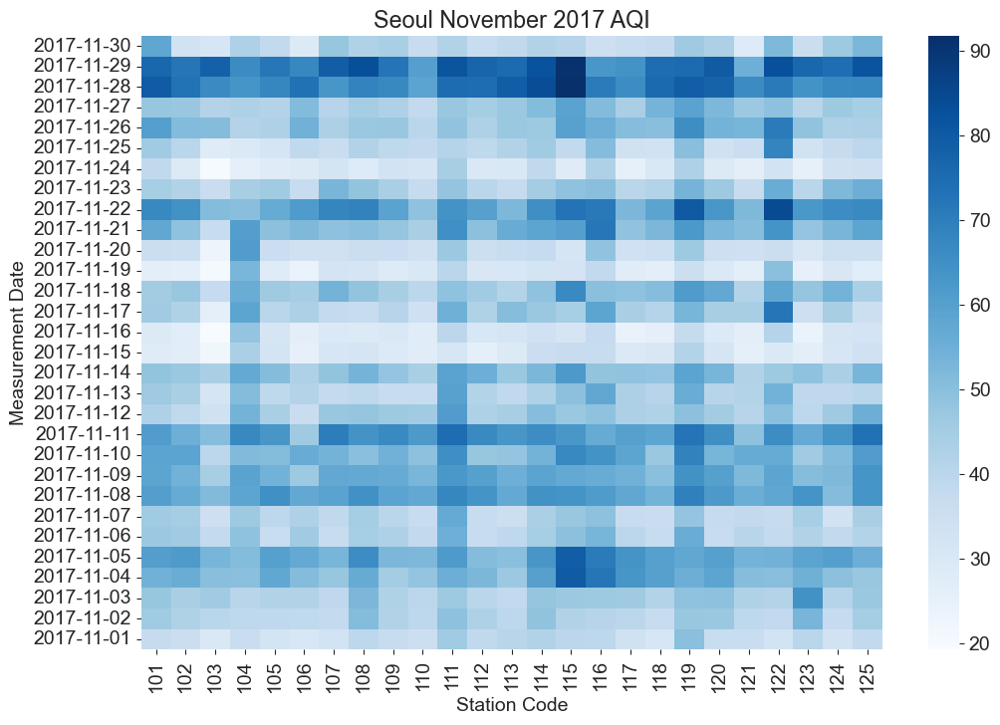

In [32]:
resampled_df = nov2017_AQI_df.resample("D").mean()
resampled_df.index = resampled_df.index.strftime("%Y-%m-%d")

#Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(resampled_df, cmap='Blues')

#Invert the y-axis so that the first day starts at point 0
plt.gca().invert_yaxis()

#Labeling axes and title
plt.ylabel('Measurement Date')
plt.xlabel('Station Code')
plt.title("Seoul November 2017 AQI")

plt.show()

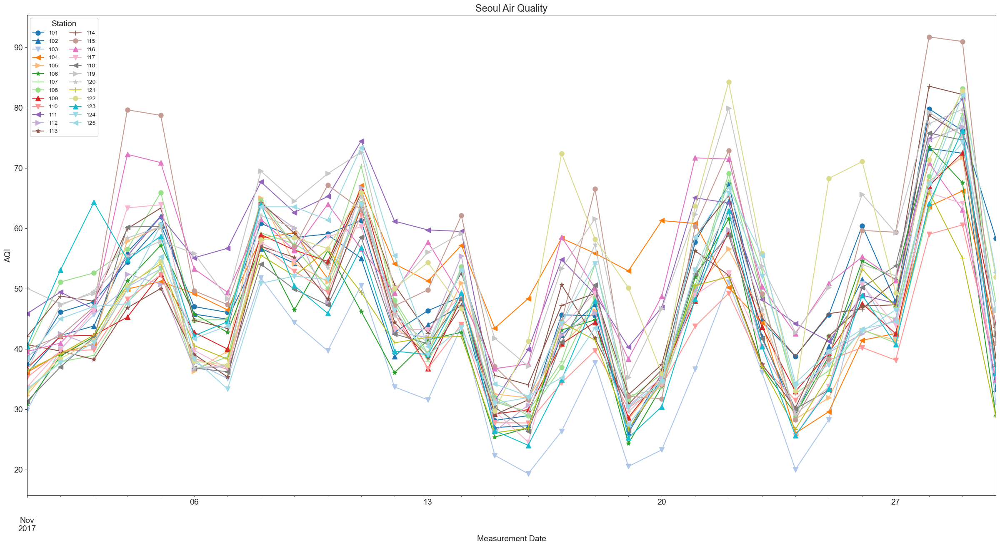

In [33]:
colors = plt.cm.get_cmap('tab20', len(nov2017_AQI_df.columns))

#Defining a list of markers
markers = ['o', '^', 'v', '<', '>', '*', '+']

#Using itertools.cycle to cycle through markers
marker_cycle = itertools.cycle(markers)

#Plotting resampled and averaged data for each station with unique color and marker
fig, ax = plt.subplots(figsize=(30, 15))

for i, col in enumerate(nov2017_AQI_df.columns):
    marker_style = next(marker_cycle)
    nov2017_AQI_df[col].resample("D").mean().plot(style="-", markersize=8, color=colors(i), marker=marker_style, ax=ax)

#Adding legend with labels
ax.legend(nov2017_AQI_df.columns, title="Station", loc="upper left", prop={'size': 10}, ncol=2)

#Labeling axes and title
plt.ylabel('AQI')
plt.xlabel('Measurement Date')
plt.title("Seoul Air Quality")

plt.show()

The AQI chart exhibits a consistent pattern of higher levels on weekdays, followed by a decline during weekends. An interesting deviation from this trend occurs on Wednesday/Thursday around the 15th/16th of the month. This pattern aligns with expectations, considering that traffic-related pollutants, major contributors to urban pollution, decrease on weekends due to reduced commuting activities.

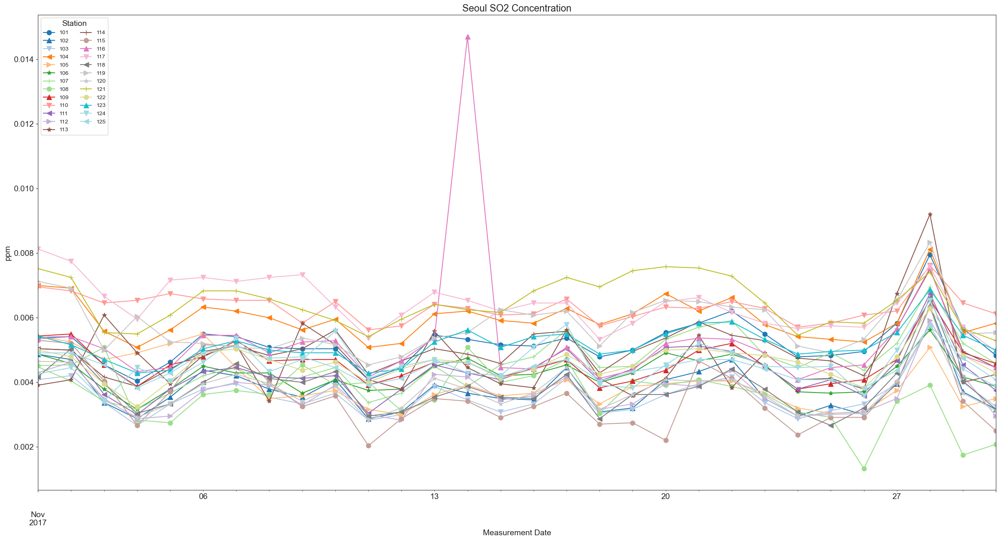

In [34]:
colors = plt.cm.get_cmap('tab20', len(nov2017_SO2_df.columns))

marker_cycle = itertools.cycle(markers)

fig, ax = plt.subplots(figsize=(30, 15))

for i, col in enumerate(nov2017_SO2_df.columns):
    marker_style = next(marker_cycle)
    nov2017_SO2_df[col].resample("D").mean().plot(style="-", markersize=8, color=colors(i), marker=marker_style, ax=ax)

ax.legend(nov2017_SO2_df.columns, title="Station", loc="upper left", prop={'size': 10}, ncol=2)

plt.ylabel('ppm')
plt.xlabel('Measurement Date') 
plt.title("Seoul SO2 Concentration")

plt.show()

Sulfur dioxide levels demonstrated stability throughout the month, with the exception of an outlier observed on the 14th at Station 116. The sudden deviation on this particular day may warrant further investigation.

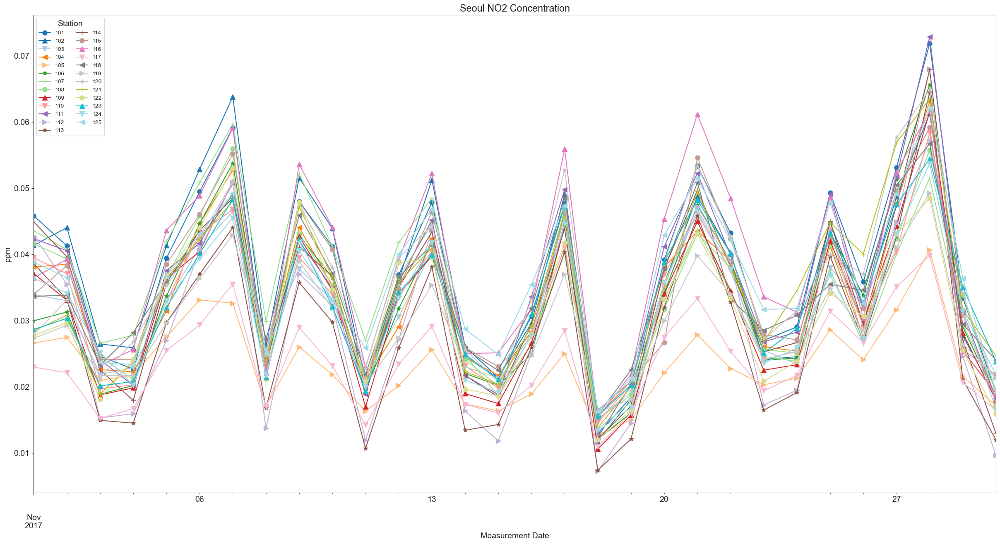

In [35]:
colors = plt.cm.get_cmap('tab20', len(nov2017_NO2_df.columns))

marker_cycle = itertools.cycle(markers)

fig, ax = plt.subplots(figsize=(30, 15))

for i, col in enumerate(nov2017_NO2_df.columns):
    marker_style = next(marker_cycle)
    nov2017_NO2_df[col].resample("D").mean().plot(style="-", markersize=8, color=colors(i), marker=marker_style, ax=ax)

ax.legend(nov2017_NO2_df.columns, title="Station", loc="upper left", prop={'size': 10}, ncol=2)

plt.ylabel('ppm')
plt.xlabel('Measurement Date') 
plt.title("Seoul NO2 Concentration")

plt.show()

The trend in nitrogen dioxide levels generally aligns with the overall AQI pattern, showcasing a decrease during weekends.

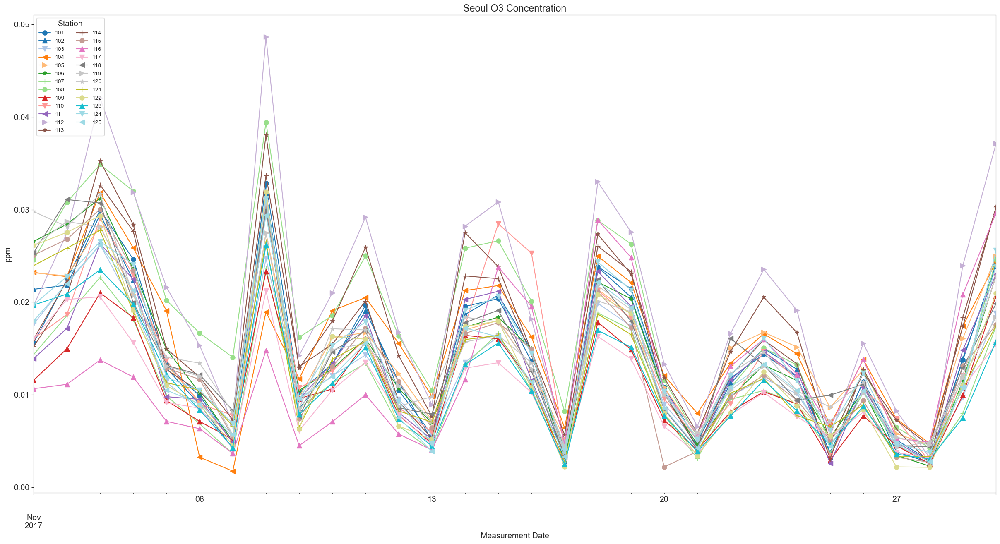

In [36]:
colors = plt.cm.get_cmap('tab20', len(nov2017_O3_df.columns))

marker_cycle = itertools.cycle(markers)

fig, ax = plt.subplots(figsize=(30, 15))

for i, col in enumerate(nov2017_O3_df.columns):
    marker_style = next(marker_cycle)
    nov2017_O3_df[col].resample("D").mean().plot(style="-", markersize=8, color=colors(i), marker=marker_style, ax=ax)

ax.legend(nov2017_O3_df.columns, title="Station", loc="upper left", prop={'size': 10}, ncol=2)

plt.ylabel('ppm')
plt.xlabel('Measurement Date')  
plt.title("Seoul O3 Concentration")

plt.show()

Unlike AQI trends, ozone levels exhibit distinct patterns, showing no significant reduction during weekends. The absence of a pronounced drop in pollution concentration on weekends suggests a unique behavior for ozone.

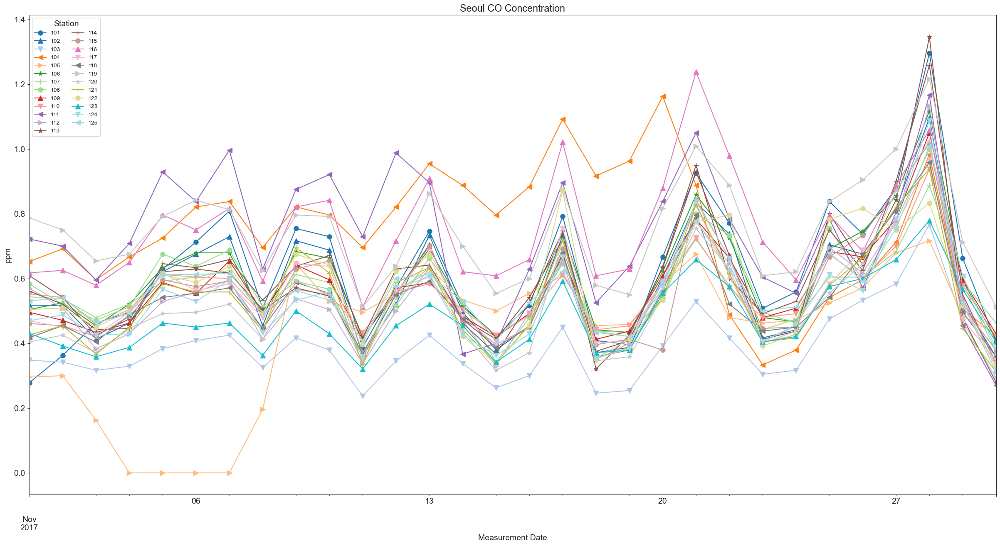

In [37]:
colors = plt.cm.get_cmap('tab20', len(nov2017_CO_df.columns))

marker_cycle = itertools.cycle(markers)

fig, ax = plt.subplots(figsize=(30, 15))

for i, col in enumerate(nov2017_CO_df.columns):
    marker_style = next(marker_cycle)
    nov2017_CO_df[col].resample("D").mean().plot(style="-", markersize=8, color=colors(i), marker=marker_style, ax=ax)

ax.legend(nov2017_CO_df.columns, title="Station", loc="upper left", prop={'size': 10}, ncol=2)

plt.ylabel('ppm')
plt.xlabel('Measurement Date') 
plt.title("Seoul CO Concentration")

plt.show()

At the onset of the month, carbon monoxide levels exhibit stability, eventually aligning with the overall AQI trend in the latter half. Notably, Station 105 stands out as an outlier, recording carbon monoxide levels at 0 ppm for an extended duration.

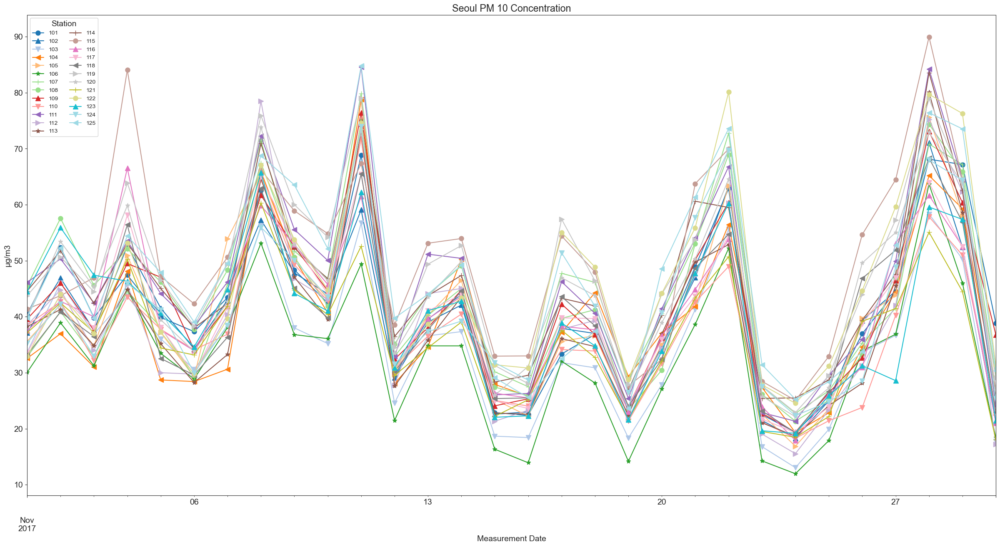

In [38]:
colors = plt.cm.get_cmap('tab20', len(nov2017_PM10_df.columns))

marker_cycle = itertools.cycle(markers)

fig, ax = plt.subplots(figsize=(30, 15))

for i, col in enumerate(nov2017_PM10_df.columns):
    marker_style = next(marker_cycle)
    nov2017_PM10_df[col].resample("D").mean().plot(style="-", markersize=8, color=colors(i), marker=marker_style, ax=ax)

ax.legend(nov2017_PM10_df.columns, title="Station", loc="upper left", prop={'size': 10}, ncol=2)

plt.ylabel('μg/m3')
plt.xlabel('Measurement Date') 
plt.title("Seoul PM 10 Concentration")

plt.show()

The PM10 levels mirror the pattern observed in the AQI chart, highlighting the significant influence of particulate matter as a primary contributor to air pollution. This alignment underscores the substantial impact of particulates on the overall air quality throughout the month. [3]

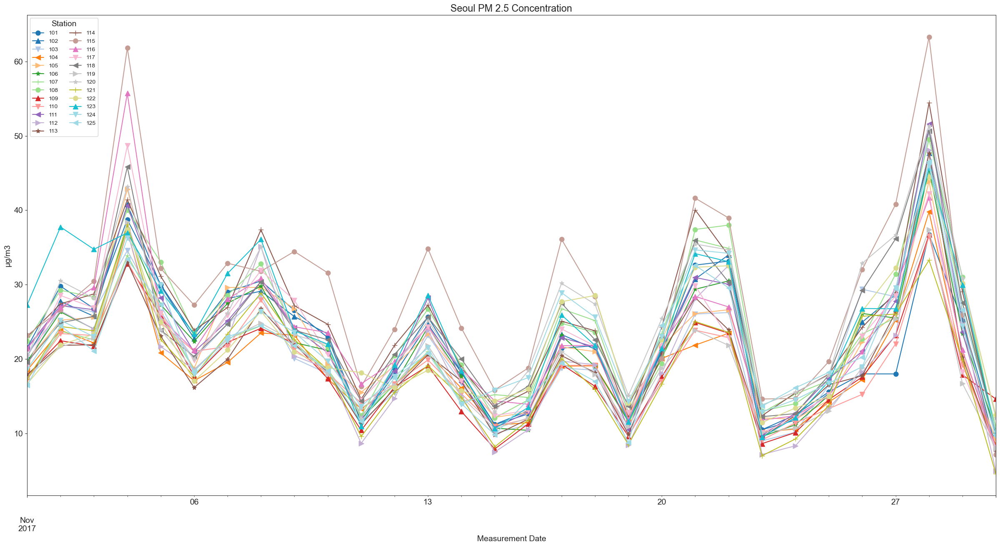

In [39]:
colors = plt.cm.get_cmap('tab20', len(nov2017_PM2_df.columns))

marker_cycle = itertools.cycle(markers)

fig, ax = plt.subplots(figsize=(30, 15))

for i, col in enumerate(nov2017_PM2_df.columns):
    marker_style = next(marker_cycle)
    nov2017_PM2_df[col].resample("D").mean().plot(style="-", markersize=8, color=colors(i), marker=marker_style, ax=ax)

ax.legend(nov2017_PM2_df.columns, title="Station", loc="upper left", prop={'size': 10}, ncol=2)

plt.ylabel('μg/m3')
plt.xlabel('Measurement Date')
plt.title("Seoul PM 2.5 Concentration")

plt.show()

As anticipated, the concentration of PM2.5 is lower than that of PM10, aligning with the overall trend observed in the AQI chart. However, an intriguing deviation occurs on the 11th, where PM2.5 concentration experiences a notable decrease, contrasting with an increase in PM10 levels during the same period.

## Further Exploration

#### AQI Comparisons

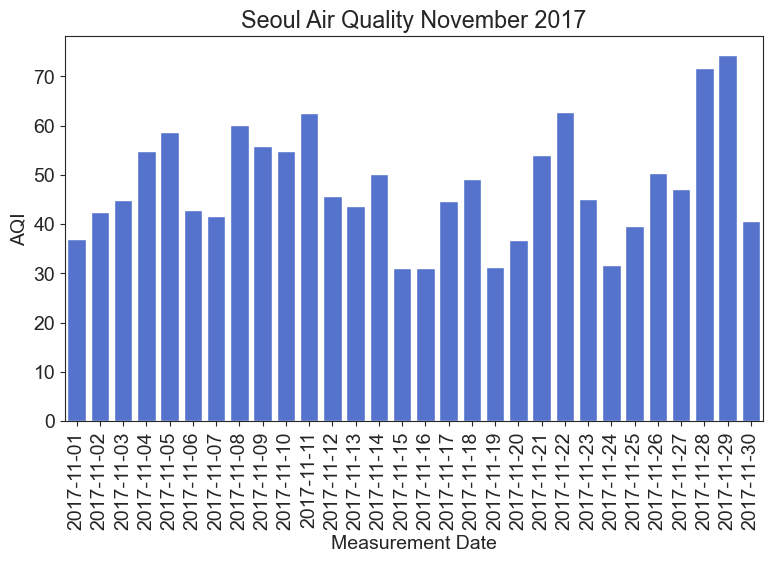

In [40]:
#Resampling the AQI data for November 2017 to daily averages
nov2017_AQI_avg_df = nov2017_AQI_df.resample("D").mean()
#Calculating the mean across all stations for each day and creating a new column 'AQI'
nov2017_AQI_avg_df['AQI'] = nov2017_AQI_avg_df.mean(axis=1)
#Setting the 'Measurement_date' column in the DataFrame to be the index
nov2017_AQI_avg_df['Measurement_date'] = nov2017_AQI_avg_df.index
nov2017_AQI_avg_df = nov2017_AQI_avg_df.reset_index(drop=True)

#Creating a bar plot to visualize the daily average AQI
sns.barplot(x=nov2017_AQI_avg_df['Measurement_date'].dt.strftime('%Y-%m-%d'), y='AQI', data=nov2017_AQI_avg_df, color='royalblue')
plt.xticks(rotation=90)
plt.xlabel('Measurement Date')
plt.title("Seoul Air Quality November 2017")
plt.show()

Daily average AQI levels recorded in Seoul for the month of November 2017

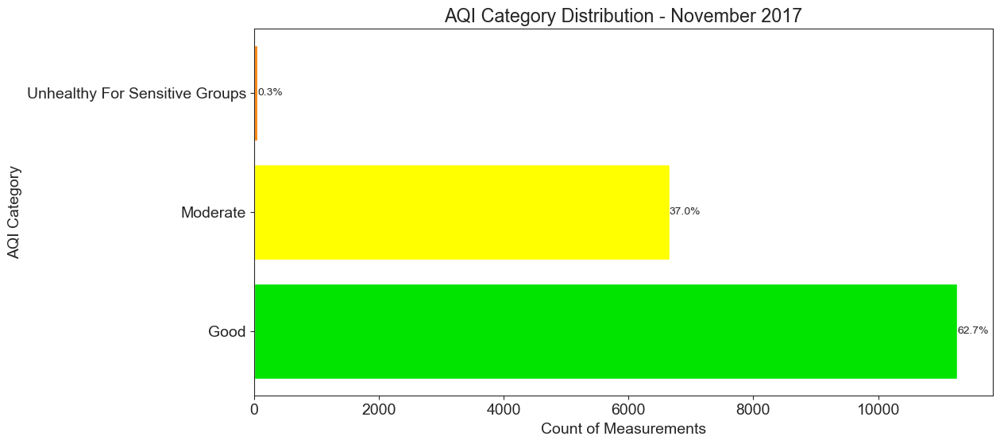

In [41]:
#Count and percentage of measurements for each AQI category
measurement_counts = nov2017_df['AQI_level'].value_counts()
measurement_percentages = nov2017_df['AQI_level'].value_counts(normalize=True) * 100

#Defining AQI categories and their corresponding colors
aqi_categories = ["Good", "Moderate", "Unhealthy For Sensitive Groups", "Unhealthy", "Very Unhealthy", "Hazardous", "nan"]
aqi_colors = ["#00e400", "#ffff00", "#ff7e00", "#ff0000", "#99004c", "#7e0023", "#000000"]

#Selecting appropriate colors based on AQI categories
colors = [aqi_colors[aqi_categories.index(category)] for category in measurement_percentages.index]

#Plotting the horizontal bar chart with custom colors
plt.figure(figsize=(12, 6))
bars = plt.barh(measurement_counts.index, measurement_counts, color=colors)
plt.xlabel('Count of Measurements')
plt.ylabel('AQI Category')
plt.title('AQI Category Distribution - November 2017')

#Adding percentage text on the graph, next to the bars
for bar, percentage in zip(bars, measurement_percentages):
    width = bar.get_width()
    plt.text(width + 1, bar.get_y() + bar.get_height()/2, f'{percentage:.1f}%', va='center', fontsize=10)

plt.show()

Roughly over a third of station measurements indicated AQI levels surpassing the 'Good' category

In [42]:
nov2017_table_df = nov2017_df.groupby(['Station_code', 'Address']).agg({'AQI_calculated': 'mean'}).reset_index()
nov2017_table_df

,Station_code,Address,AQI_calculated
0,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",50.139082
1,102,"15, Deoksugung-gil, Jung-gu, Seoul, Republic o...",46.460362
2,103,"136, Hannam-daero, Yongsan-gu, Seoul, Republic...",39.218359
3,104,"215, Jinheung-ro, Eunpyeong-gu, Seoul, Republi...",49.995828
4,105,"32, Segeomjeong-ro 4-gil, Seodaemun-gu, Seoul,...",45.509040
5,106,"10, Poeun-ro 6-gil, Mapo-gu, Seoul, Republic o...",44.273992
6,107,"18, Ttukseom-ro 3-gil, Seongdong-gu, Seoul, Re...",46.449235
7,108,"571, Gwangnaru-ro, Gwangjin-gu, Seoul, Republi...",49.036161
8,109,"43, Cheonho-daero 13-gil, Dongdaemun-gu, Seoul...",45.840056
9,110,"369, Yongmasan-ro, Jungnang-gu, Seoul, Republi...",42.239221


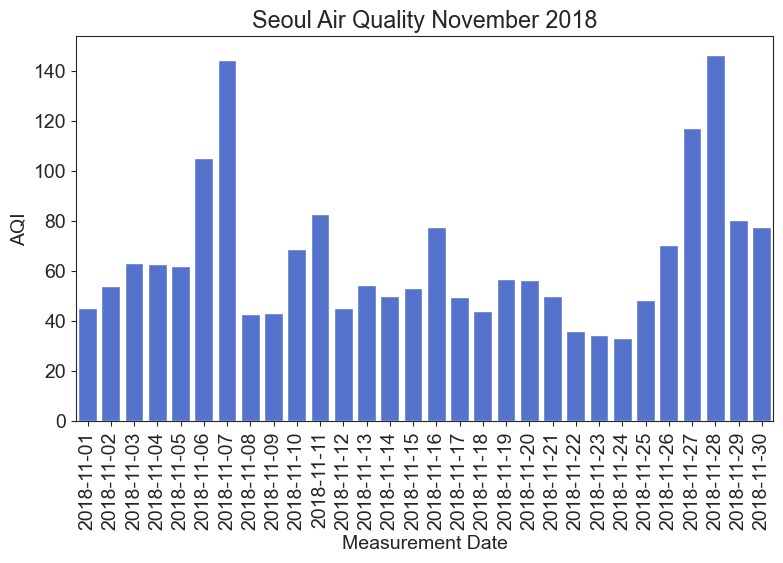

In [43]:
#Selecting data for November 2018 based on Measurement Date
nov2018_df = air_pollution_df.query("'2018-11-01'< Measurement_date < '2018-12-01'")
nov2018_AQI_df = nov2018_df.pivot(index = "Measurement_date", columns = "Station_code", values = "AQI_calculated")

nov2018_AQI_avg_df = nov2018_AQI_df.resample("D").mean()
nov2018_AQI_avg_df['AQI'] = nov2018_AQI_avg_df.mean(axis=1)
nov2018_AQI_avg_df['Measurement_date'] = nov2018_AQI_avg_df.index
nov2018_AQI_avg_df = nov2018_AQI_avg_df.reset_index(drop=True)

sns.barplot(x=nov2018_AQI_avg_df['Measurement_date'].dt.strftime('%Y-%m-%d'), y='AQI', data=nov2018_AQI_avg_df, color='royalblue')
plt.xticks(rotation=90)
plt.xlabel('Measurement Date')
plt.title("Seoul Air Quality November 2018")
plt.show()

Daily average AQI levels recorded in Seoul for the month of November 2018

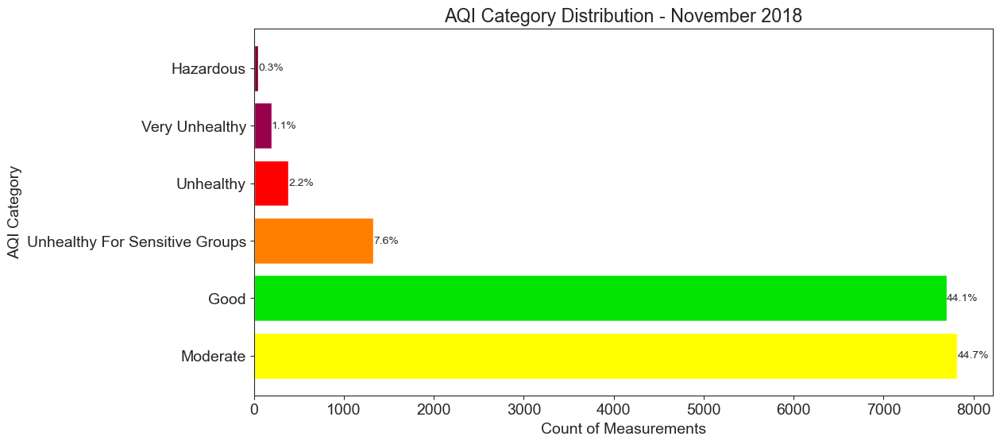

In [44]:
measurement_counts = nov2018_df['AQI_level'].value_counts()
measurement_percentages = nov2018_df['AQI_level'].value_counts(normalize=True) * 100

colors = [aqi_colors[aqi_categories.index(category)] for category in measurement_percentages.index]

plt.figure(figsize=(12, 6))
bars = plt.barh(measurement_counts.index, measurement_counts, color=colors)
plt.xlabel('Count of Measurements')
plt.ylabel('AQI Category')
plt.title('AQI Category Distribution - November 2018')

for bar, percentage in zip(bars, measurement_percentages):
    width = bar.get_width()
    plt.text(width + 1, bar.get_y() + bar.get_height()/2, f'{percentage:.1f}%', va='center', fontsize=10)

plt.show()

There is a significant rise in AQI levels in Seoul during November 2018 compared to the previous year

In [45]:
nov2018_table_df = nov2018_df.groupby(['Station_code', 'Address']).agg({'AQI_calculated': 'mean'}).reset_index()
nov2018_table_df

,Station_code,Address,AQI_calculated
0,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",61.176634
1,102,"15, Deoksugung-gil, Jung-gu, Seoul, Republic o...",56.356050
2,103,"136, Hannam-daero, Yongsan-gu, Seoul, Republic...",55.214186
3,104,"215, Jinheung-ro, Eunpyeong-gu, Seoul, Republi...",68.321280
4,105,"32, Segeomjeong-ro 4-gil, Seodaemun-gu, Seoul,...",68.221591
5,106,"10, Poeun-ro 6-gil, Mapo-gu, Seoul, Republic o...",90.331015
6,107,"18, Ttukseom-ro 3-gil, Seongdong-gu, Seoul, Re...",51.151599
7,108,"571, Gwangnaru-ro, Gwangjin-gu, Seoul, Republi...",86.527121
8,109,"43, Cheonho-daero 13-gil, Dongdaemun-gu, Seoul...",62.511822
9,110,"369, Yongmasan-ro, Jungnang-gu, Seoul, Republi...",50.372740


#### Seasonal Variation

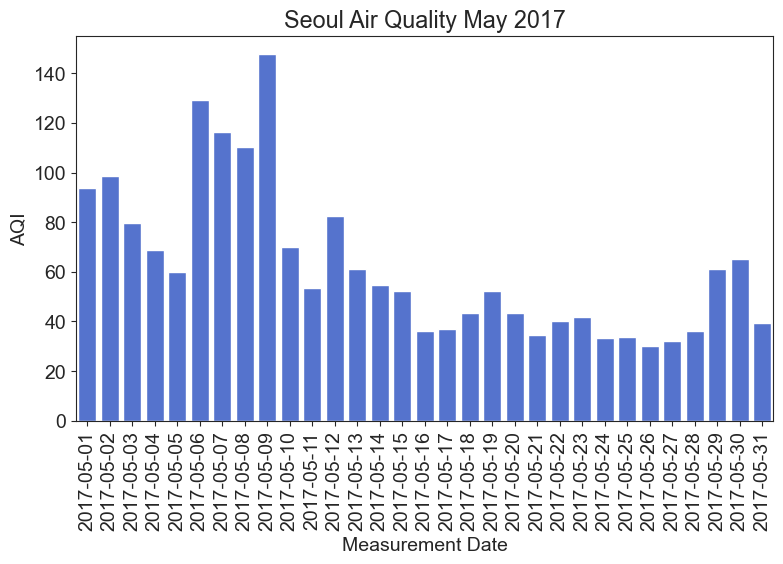

In [46]:
may2017_df = air_pollution_df.query("'2017-05-01' < Measurement_date < '2017-06-01'")
may2017_AQI_df = may2017_df.pivot(index="Measurement_date", columns="Station_code", values="AQI_calculated")

may2017_AQI_avg_df = may2017_AQI_df.resample("D").mean()
may2017_AQI_avg_df['AQI'] = may2017_AQI_avg_df.mean(axis=1)

may2017_AQI_avg_df['Measurement_date'] = may2017_AQI_avg_df.index
sns.barplot(x=may2017_AQI_avg_df['Measurement_date'].dt.strftime('%Y-%m-%d'), y='AQI', data=may2017_AQI_avg_df, color='royalblue')
plt.xticks(rotation=90)
plt.xlabel('Measurement Date')
plt.title("Seoul Air Quality May 2017")
plt.show()

Daily average AQI levels recorded in Seoul for the month of May 2017

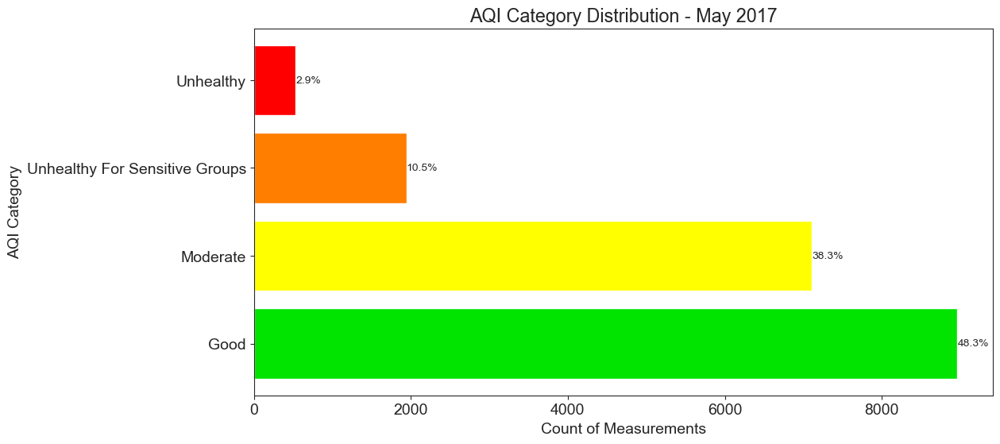

In [47]:
#Count and percentage of measurements for each AQI category
measurement_counts = may2017_df['AQI_level'].value_counts()
measurement_percentages = may2017_df['AQI_level'].value_counts(normalize=True) * 100

#Selecting appropriate colors based on AQI categories
colors = [aqi_colors[aqi_categories.index(category)] for category in measurement_percentages.index]

#Plotting the horizontal bar chart with custom colors
plt.figure(figsize=(12, 6))
bars = plt.barh(measurement_counts.index, measurement_counts, color=colors)
plt.xlabel('Count of Measurements')
plt.ylabel('AQI Category')
plt.title('AQI Category Distribution - May 2017')

#Adding percentage text on the graph, next to the bars
for bar, percentage in zip(bars, measurement_percentages):
    width = bar.get_width()
    plt.text(width + 1, bar.get_y() + bar.get_height()/2, f'{percentage:.1f}%', va='center', fontsize=10)

plt.show()

The month of May exhibits a notable increase in air pollution levels compared to November. Assessing the influence of seasons on air quality is challenging due to various factors as different types of pollutants and weather conditions play a role in air quality. [5] Therefore, understanding the specific factors contributing to increased air pollution in May requires a more comprehensive analysis, considering pollutant types and prevailing weather conditions during that particular season of observation. [6]

#### Relationship between Ozone and Nitrogen Dioxide

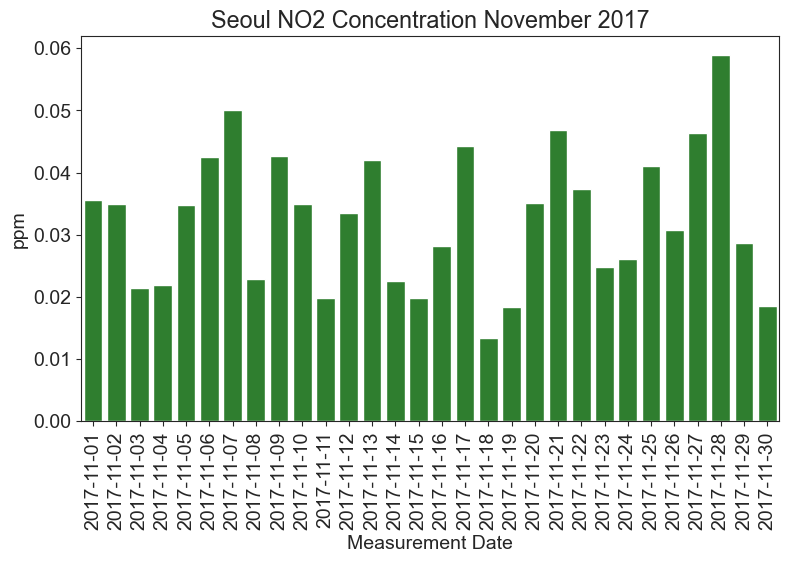

In [48]:
nov2017_NO2_avg_df = nov2017_NO2_df.resample("D").mean()
nov2017_NO2_avg_df['ppm'] = nov2017_NO2_avg_df.mean(axis=1)
nov2017_NO2_avg_df['Measurement_date'] = nov2017_NO2_avg_df.index
nov2017_NO2_avg_df = nov2017_NO2_avg_df.reset_index(drop=True)

sns.barplot(x=nov2017_NO2_avg_df['Measurement_date'].dt.strftime('%Y-%m-%d'), y='ppm', data=nov2017_NO2_avg_df, color='forestgreen')
plt.xticks(rotation=90)
plt.xlabel('Measurement Date')
plt.title("Seoul NO2 Concentration November 2017")
plt.show()

Daily average NO2 levels recorded in Seoul for the month of November 2017

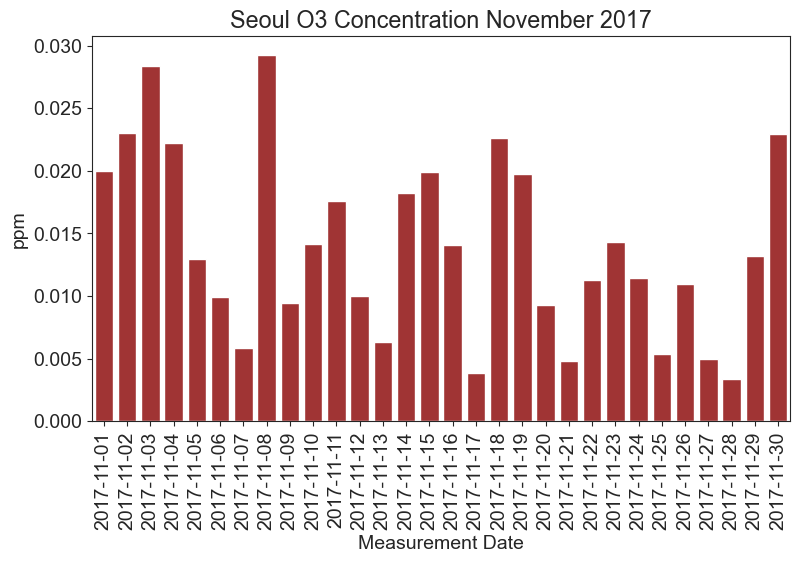

In [49]:
nov2017_O3_avg_df = nov2017_O3_df.resample("D").mean()
nov2017_O3_avg_df['ppm'] = nov2017_O3_avg_df.mean(axis=1)
nov2017_O3_avg_df['Measurement_date'] = nov2017_O3_avg_df.index
nov2017_O3_avg_df = nov2017_O3_avg_df.reset_index(drop=True)

sns.barplot(x=nov2017_O3_avg_df['Measurement_date'].dt.strftime('%Y-%m-%d'), y='ppm', data=nov2017_O3_avg_df, color='firebrick')
plt.xticks(rotation=90)
plt.xlabel('Measurement Date')
plt.title("Seoul O3 Concentration November 2017")
plt.show()

Daily average O3 levels recorded in Seoul for the month of November 2017

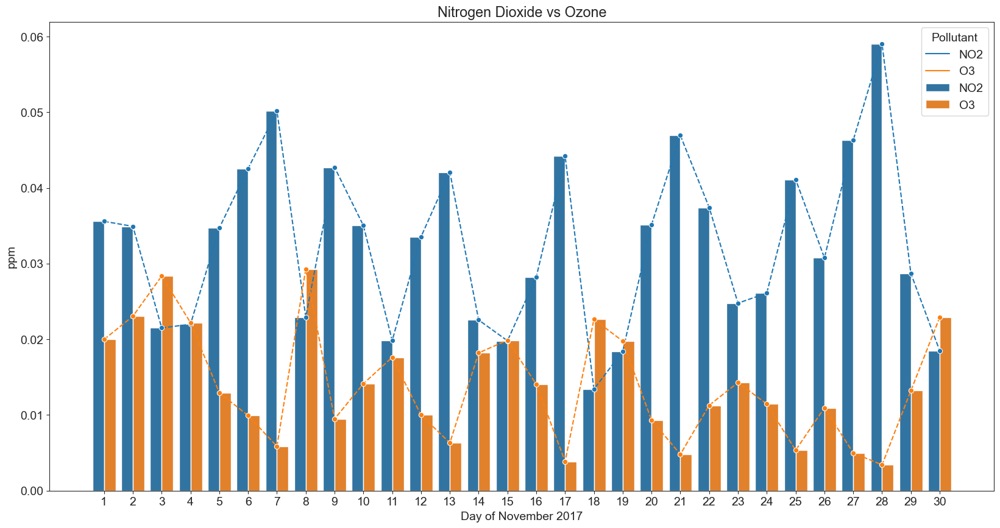

In [50]:
#Setting the 'Measurement_date' column as the index for NO2 DataFrame
nov2017_NO2_avg_df = nov2017_NO2_avg_df.set_index('Measurement_date', drop=False)

#Creating 'Day' and 'Pollutant' columns
nov2017_NO2_avg_df['Day'] = nov2017_NO2_avg_df.index.day
nov2017_NO2_avg_df['Pollutant'] = 'NO2'

#Setting the 'Measurement_date' column as the index for O3 DataFrame
nov2017_O3_avg_df = nov2017_O3_avg_df.set_index('Measurement_date', drop=False)

#Creating 'Day' and 'Pollutant' columns
nov2017_O3_avg_df['Day'] = nov2017_O3_avg_df.index.day
nov2017_O3_avg_df['Pollutant'] = 'O3'

#Combining the DataFrames
combined_df = pd.concat([nov2017_NO2_avg_df, nov2017_O3_avg_df]).reset_index(drop=True)

#Plotting
plt.figure(figsize=(20, 10))
sns.barplot(x='Day', y='ppm', hue='Pollutant', data=combined_df, dodge=True)
plt.xlabel("Day of November 2017")
plt.ylabel("ppm")
plt.title("Nitrogen Dioxide vs Ozone")
plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc='upper left')
sns.lineplot(x=combined_df['Day'].astype(float) - 1, y='ppm', hue='Pollutant', data=combined_df, marker='o', linestyle='dashed')
plt.show()

We observe a subtle 'Weekend Effect' wherein Ozone levels increase, defying the usual expectation given the reduced presence of its precursors, VOCs, and NO2 during weekends. Ozone formation is influenced by a specific ratio between VOCs and NO2. If the decline in NO2 is insufficient to bring it below this critical threshold, it can paradoxically boost the reaction rate, resulting in an unexpected rise in Ozone production.[7][8]

#### What percentage of measurements had abnormal results?

In [51]:
pollutants = ['SO2', 'NO2', 'O3', 'CO', 'PM2.5', 'PM10']

#List to store abnormal rates for each station
abnormal_rates_by_station = []

#Iterating through stations
for station_code in nov2017_df['Station_code'].unique():
    #Calculating abnormal counts for each pollutant at the current station
    abnormal_counts = sum(len(nov2017_df[(nov2017_df['Station_code'] == station_code) & (nov2017_df[pollutant] <= 0)]) for pollutant in pollutants)
    
    #Calculating the total number of measurements for the current station
    total_measurements = len(nov2017_df[nov2017_df['Station_code'] == station_code])
    
    #Calculating the abnormal rate for the current station
    abnormal_rate = (abnormal_counts / total_measurements) * 100
    
    #Appending the result to the list
    abnormal_rates_by_station.append({'Station_code': station_code, 'Abnormal_rate': abnormal_rate})

#Creating a DataFrame from the list
abnormal_rates_df = pd.DataFrame(abnormal_rates_by_station)

#Printing the DataFrame
print(abnormal_rates_df)

    Station_code  Abnormal_rate
0            101       1.112656
1            102       0.000000
2            103       1.808067
3            104       3.198887
4            105      17.802503
5            106       1.112656
6            107       1.390821
7            108       2.503477
8            109       0.834492
9            110       0.695410
10           111       0.834492
11           112       0.834492
12           113       2.503477
13           114       0.000000
14           115       9.179416
15           116       1.251739
16           117       0.556328
17           118       0.000000
18           119       0.000000
19           120       0.834492
20           121       1.529903
21           122       1.668985
22           123       0.417246
23           124       0.139082
24           125       0.973574


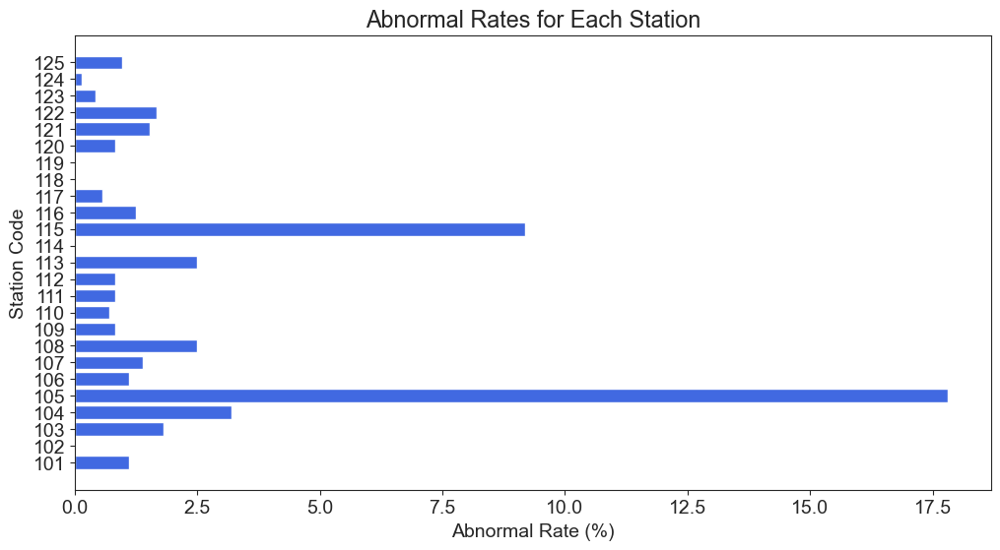

In [52]:
#Converting 'Abnormal_rate' to float for plotting
abnormal_rates_df['Abnormal_rate'] = abnormal_rates_df['Abnormal_rate'].astype(float)

#Plotting the horizontal bar chart
plt.figure(figsize=(12, 6))
plt.barh(abnormal_rates_df['Station_code'].astype(str), abnormal_rates_df['Abnormal_rate'], color= 'royalblue')
plt.xlabel('Abnormal Rate (%)')
plt.ylabel('Station Code')
plt.title('Abnormal Rates for Each Station')
plt.show()

Visual representation illustrating abnormal rates observed at each station, providing insights into distinctive patterns and variations in air pollution levels at different locations.

#### Full Year Trends 

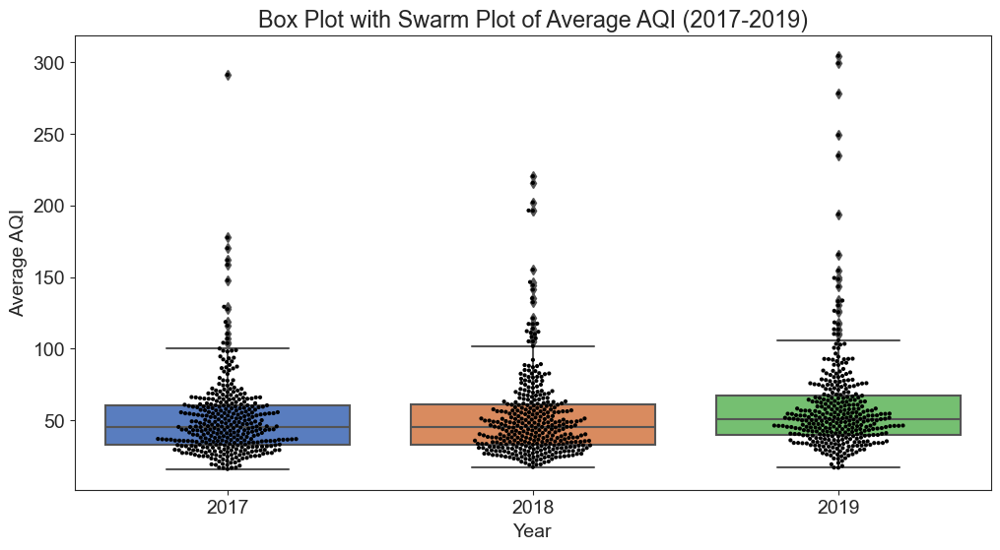

In [53]:
df_2017 = air_pollution_df.query("'2017-01-01'< Measurement_date < '2017-12-31'").copy()
df_2018 = air_pollution_df.query("'2018-01-01'< Measurement_date < '2018-12-31'").copy()
df_2019 = air_pollution_df.query("'2019-01-01'< Measurement_date < '2019-12-31'").copy()

#Convert 'Measurement_date' to datetime type and set it as the index
df_2017['Measurement_date'] = pd.to_datetime(df_2017['Measurement_date'])
df_2017 = df_2017.set_index('Measurement_date')

df_2018['Measurement_date'] = pd.to_datetime(df_2018['Measurement_date'])
df_2018 = df_2018.set_index('Measurement_date')

df_2019['Measurement_date'] = pd.to_datetime(df_2019['Measurement_date'])
df_2019 = df_2019.set_index('Measurement_date')

#Separate the DataFrames for 2017, 2018, and 2019
df_2017_AQI_avg = df_2017.resample("D").mean()['AQI_calculated']
df_2018_AQI_avg = df_2018.resample("D").mean()['AQI_calculated']
df_2019_AQI_avg = df_2019.resample("D").mean()['AQI_calculated']

#Combine the DataFrames for 2017, 2018, and 2019
combined_df = pd.concat([df_2017_AQI_avg, df_2018_AQI_avg, df_2019_AQI_avg], keys=['2017', '2018', '2019'])

plt.figure(figsize=(12, 6))
sns.boxplot(x=combined_df.index.get_level_values(0), y=combined_df, palette='muted')
sns.swarmplot(x=combined_df.index.get_level_values(0), y=combined_df, color='black', size=3)
plt.xlabel('Year')
plt.ylabel('Average AQI')
plt.title('Box Plot with Swarm Plot of Average AQI (2017-2019)')
plt.show()

An observable trend suggests an upward trajectory in air pollution levels as we transition into the year 2019. This indicates a potential shift or pattern in atmospheric conditions that may influence pollutant concentrations. A more in-depth analysis could provide insights into the contributing factors driving this trend.

In [55]:
import folium
from geopy.geocoders import Nominatim
from IPython.display import display

#Merging dataframes
merged_df = pd.merge(nov2017_table_df, nov2018_table_df, on=['Station_code', 'Address'], suffixes=('_2017', '_2018'))

#Initialize the map centered on Seoul
m = folium.Map(location=[37.57, 126.98], zoom_start=10) 

#Initialize geocoder
geolocator = Nominatim(user_agent="my_agent")

#Processing merged dataframe
for idx, row in merged_df.iterrows():
    address = row['Address']
    station_code = row['Station_code']
    aqi_2017 = round(row['AQI_calculated_2017'], 2)  
    aqi_2018 = round(row['AQI_calculated_2018'], 2)  
    
    #Geocode the address
    try:
        location = geolocator.geocode(address)
        if location:
            folium.Marker(
                location=[location.latitude, location.longitude],
                tooltip=folium.Tooltip(
                    f"Station Code: {station_code}<br>AQI Nov 2017: {aqi_2017}<br>AQI Nov 2018: {aqi_2018}",
                    permanent=True
                )
            ).add_to(m)
    except Exception as e:
        print(f"Error geocoding {address}: {e}")

#Displaying  map
display(m)

## Inferences and Potential Exploration

The project offered an overview of vital data manipulation techniques, covering fundamental operations such as renaming, deleting, and sorting columns, as well as reshaping data frames to fulfill various requirements. Additionally, the impact of conditional statements and functions for advanced data transformations were explored, emphasizing the versatility of data structures and shedding light on the intricacies of converting data frames to ensure smooth compatibility with diverse analytical tools. Furthermore, the project ventured into the realm of data visualization, imparting skills in crafting impactful line charts, bar charts, and heat maps. 

Analyzing air quality data from November 2017 in Seoul provides crucial insights into the city's environmental conditions. During this period, Station 103 in Hannam-dong, one of the most affluent neighborhoods in all of Seoul, reported the lowest pollutant levels, contrasting with Station 119 in Yeongdeungpo, which documented the highest pollution. [9][10] Yeongdeungpo district is at the center of the financial sector of Seoul with a history of heavy industry.[11][12] This analysis not only unveils significant variations in air quality across Seoul's neighborhoods but also underscores the relevance of considering socio-economic factors in understanding pollution patterns. While Station 103 in the upscale Hannam-dong reflects lower pollutant levels, likely influenced by its affluent surroundings, Station 119 in the industrially rooted Yeongdeungpo district exhibits higher pollution levels. This nuanced portrayal reinforces the need for targeted interventions tailored to the specific characteristics of each neighborhood. Despite minor data collection issues, the robustness of the measurements ensures the credibility of our findings, providing a foundation for informed decision-making in addressing air quality challenges in Seoul.

In November 2018, Seoul experienced a notable increase in air pollution levels, shedding light on evolving environmental conditions. Station 103 continued to maintain low pollution levels, while Station 112, situated in the Gangbuk district, emerged with the lowest AQI levels in the city. Notably, both Station 103 and Station 112 share a geographical commonality— located north of the Han River amidst green zones comprising forests and parks. [13] In contrast, Station 119 relinquished its position to several stations, with Station 124 in the Songpa district registering an outlier AQI value. Comparable to Station 119, Station 124, is located south of the Han River, and played a pivotal role in the city's development during the lead-up to the Olympics and Pan-Asian games, hosting key sports facilities. [14] This highlights the importance of targeted environmental policies and interventions, emphasizing the complex interplay between urban planning, industrial activities, and air pollution.

The trend of escalating air pollution in Seoul persisted into 2019, prompting a legislative response from the Korean government in March. The legislature passed resolutions aimed at addressing the health crisis, including measures to allocate emergency funds to local administration. Specific actions were taken, such as deprioritizing the sale of petrol/diesel vehicles and installing air purifiers in public buildings. [15] These proactive steps were crucial in combating the rise in particulate matter, particularly PM2.5, known for its severe health ramifications with prolonged exposure. In the realm of air pollution control, various unit operations designed for industrial-scale usage play a pivotal role. These include cyclones, electrostatic precipitators (ESPs), fabric filters, and scrubbers. In this context, ESPs and fabric filters emerge as particularly effective, boasting higher collection efficiencies when dealing with very fine particles such as PM2.5. [3] This strategic application of unit operations aligns with the urgent need to address the specific challenges posed by the escalating air pollution in Seoul.

The findings drawn from this project regarding Seoul's air pollution measurement stations represent a snapshot of the broader picture. For example, despite having environmental standards in place for many years, Station 124 in Songpa remained an outlier with the highest AQI in November 2018. [14] A more comprehensive analysis, utilizing the most recent data, could shed light on the effectiveness of the initiatives introduced by the Korean government. It's crucial to acknowledge factors beyond their control, such as the influence of pollution from neighboring countries like China. The decline in air pollution concentrations worldwide during the Covid-19 pandemic, including Seoul, offers a unique perspective. [16] However, the reality facing South Korea is that concentrations of particulate matter still pose a significant health concern for the population. Looking ahead, future analyses could delve deeper into the specifics of environmental standards, explicitly connecting recent data to government initiatives, and exploring the nuanced ways in which external factors impact Seoul's air quality. Additionally, investigating the long-term effects of the Covid-19 pandemic on air pollution trends and assessing the ongoing effectiveness of government measures could provide valuable insights for proactive air quality management.

In conclusion, this analysis offers a glimpse into Seoul's air pollution landscape, emphasizing the need for ongoing scrutiny and strategic interventions. A comprehensive, up-to-date examination, leveraging the latest data, is imperative to evaluate the efficacy of government initiatives. Recognizing factors beyond local control, such as cross-border pollution, adds another layer of complexity. The global dip in air pollution during the Covid-19 pandemic offers a unique vantage point, but the persistent threat of particulate matter demands sustained attention in South Korea. Looking forward, further investigations should scrutinize environmental standards, connect recent data to governmental actions, and explore nuanced external influences on air quality. Assessing the long-term repercussions of the pandemic and the ongoing effectiveness of measures will provide invaluable insights for proactive air quality management, urging continual analysis, policy refinement, and international cooperation to safeguard public health and the environment.

## References

[1] Bappe. “Air Pollution in Seoul.” Kaggle, 3 Apr. 2020, www.kaggle.com/datasets/bappekim/air-pollution-in-seoul

[2] “Technical Assistance Document for the Reporting of Daily Air .” AirNow, U.S. Environmental Protection Agency, Sept. 2018, www.airnow.gov/sites/default/files/2020-05/aqi-technical-assistance-document-sept2018.pdf

[3] Cooper, C. D. (2011). Air Pollution Control: A Design Approach (4th ed.). Waveland Press, Inc.

[4] Rohanrao. “Calculating AQI (Air Quality Index) Tutorial.” Kaggle, 22 Aug. 2020, www.kaggle.com/code/rohanrao/calculating-aqi-air-quality-index-tutorial

[5] “Center for Science Education.” How Weather Affects Air Quality, scied.ucar.edu/learning-zone/air-quality/how-weather-affects-air-quality

[6] “Increased Air Pollution: Is It Worse during the Summer or Winter?” Airly, airly.org/en/increased-air-pollution-is-it-worse-during-the-summer-or-winter/

[7] Borrell, Peter. “The Weekend Effect.” Chemistry World, 30 Apr. 2003, www.chemistryworld.com/news/the-weekend-effect/3003987.article

[8] Spinrad, Paul. “The Ozone Weekend Effect.” Berkeley Engineering, Mar. 2009, engineering.berkeley.edu/news/2009/03/the-ozone-weekend-effect

[9]  Hannam-Dong Is Mini Global Village in Central Seoul, The Korea Times, 21 Nov. 2008, www.koreatimes.co.kr/www/news/nation/2008/11/123_34837.html 

[10] “Hannam-Dong the Neighborhood of Gourmet Food and Culture.” VisitSeoul, Sept. 2023, english.visitseoul.net/hallyu/Hallyu-Hannam_/44576

[11] “Location and Regional Characteristics.” Yeongdeungpo-Gu Official Website,  Seoul Metropolitan Government, www.ydp.go.kr/english/contents.do?key=4294& 

[12] Kyle, Brock. “Join the Art-Industrial Complex.” Travelgasm, Jan. 2019, travelgasm.com/seoul-south-korea/mullae-dong-art-village-steel-ironworks-seoul-south-korea.html

[13] Gangbuk-Gu Official Website, Seoul Metropolitan Government, www.gangbuk.go.kr/eng/index.do

[14] “Local Features.” Songpa-Gu Official Website, Seoul Metropolitan Government, www.songpa.go.kr/eng/contents.do?key=3951&

[15] “‘Social Disaster’: South Korea Brings in Emergency Laws to Tackle Dust Pollution.” The Guardian, 13 Mar. 2019, www.theguardian.com/environment/2019/mar/13/social-disaster-south-korea-brings-in-emergency-laws-to-tackle-dust-pollution

[16] Burbano, Lucia. “How Seoul Is Struggling to Improve Its Air Quality.” Tomorrow.City, Feb. 2022, www.tomorrow.city/seoul-air-quality-improvement